In [1]:
%%time
import sys, os
# import pickle
year = '2023'
path_gen = '/home/eliasmfs/Erasmus MC/Projects/CerebellarLoop'
path_data = f'/mnt/User_Data/UserData/eliasmfs/CerebellarLoop/SlowData/'
path_code = f'{path_gen}/Code/{year}/CerebellarLoop'
path_functions = f'{path_code}/Functions'
sys.path.append(path_data)
sys.path.append(path_functions)

from Run import *
from tqdm import tqdm
from scipy.signal import butter, lfilter, sosfiltfilt, find_peaks
import matplotlib.style as style 
style.use('seaborn-colorblind')


record = {}
record['Noise'] = True
record['PC'] = True
record['DCN'] = True
record['IO'] = True 
record['conn_N_PC'] = True
record['Input_presyn'] = True

save = 1
show = 0

noise_gain_range =  [1]

exp_run = 120000*ms
N_Cells_PC = 100
N_Cells_DCN = 40
N_Cells_IO = 40
N_Cells_PF = 5
plasticity_range = ['no_Plasticity','Plasticity','after_Plasticity']
coupling_range = ['','_Coupled']
zebrin_range = ['positive', 'negative']

# seed_number_range = []
# for num in range(10):
#     for N_Cells_PF_events in [0]:#0,1,2]:
#         N_Cells_PF_OU = N_Cells_PF - N_Cells_PF_events     
#         if N_Cells_PF_events == 0: 
#             CS_val = 0
#             US_val = 0
#             seed_number_range.append(f'Event_{num}_OU_{N_Cells_PF_OU}_Stim_{N_Cells_PF_events}_CS_{CS_val}_US_{US_val}')
#             continue
#         for CS_val in range(5,10,2):
#             for US_val in range(5,20,5):
#                 seed_number_range.append(f'Event_{num}_OU_{N_Cells_PF_OU}_Stim_{N_Cells_PF_events}_CS_{CS_val}_US_{US_val}')        

                
seed_number_range = []     
for num in range(2,3):
    seed_number_range.append(f'Paper_all_and_eyeblink')

seed_number = seed_number_range[0]

zebrin = zebrin_range[0]
noise_gain = 1

range_plasticity = ['Plasticity']
range_after_plasticity = ['after_Plasticity']

plas_range = 4
if plas_range > 1:
    for plas_num in range(2,plas_range+1):
        plasticity_range.append(f'Plasticity{plas_num}')
        range_plasticity.append(f'Plasticity{plas_num}')
        plasticity_range.append(f'after_Plasticity{plas_num}')
        range_after_plasticity.append(f'after_Plasticity{plas_num}')
        
f0_range = [0]#,5,10,15,20,25,50,100,800,1000,1100,1200,1300,1400,1500]

parameters_value = { "range_plasticity": range_plasticity, "range_after_plasticity": range_after_plasticity,
                    "PC_I_intrinsic": 0.15, "thresh_M": 60*Hz, "delta_weight_BCM": 0, "delta_weight_CS": -0.1,#-0.02

                    "unfiltered": True, "filtered": True, "f0_range": f0_range, "filter_order": 6, 
                    "positive":{
                        "Uncoupled":{'w_IO_DCN': -2.0, 'PC_DCN': 5.0, 'leak': 0.001, 'gCal': 1.2, 'b_OU': -0.7, 
                                     'sigma_OU': 0.7},
                        'Coupled': {'w_IO_DCN': -2.0, 'PC_DCN': 5.0, 'leak': 0.001, 'gCal': 1.4, 'b_OU': -0.3,
                                    'sigma_OU': 0.7}},
                    'negative':{
                        'Uncoupled': {'w_IO_DCN': -1.8, 'PC_DCN': 4.0, 'leak': 0.001, 'gCal': 1.4, 'b_OU': -0.3,
                                      'sigma_OU': 0.3},
                        'Coupled': {'w_IO_DCN': -1.8, 'PC_DCN': 4.0, 'leak': 0.001, 'gCal': 1.4, 'b_OU': -0.6, 
                                    'sigma_OU': 0.7}}}



Params, Noise_frozen, Values, Synaps, net_name = frozen_tun(seed_number_range,N_Cells_PC,N_Cells_DCN,N_Cells_IO,path_data,exp_run)
IO_num_con = Synaps['Seed_'+str(seed_number)].IO_PC_Synapse_Sources

dt = Params['Seed_'+str(seed_number)].dt
dt_rec = float(Params['Seed_'+str(seed_number)].dt_rec)
time_x = [x * dt for x in range(0,int(exp_run/dt))]
time_x_rec = [x * dt for x in range(0,int(exp_run/dt_rec))]


coupling = '_Coupled'
plasticity = 'no_Plasticity'
f0 = 0

zebrin_col = dict(positive='b',negative='r')
linstyle = dict(no_Plasticity='-',after_Plasticity='--')

WARNING    <timed exec>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
 [py.warnings]



CPU times: user 31 s, sys: 8.63 s, total: 39.7 s
Wall time: 34.2 s


# Figure 4 - A

### PSC Plot

In [2]:
%%time
step = 2.5
data=[]
for f0 in f0_range[0:1]:
    for zebrin in ['negative','positive']:
        for plasticity in ['no_Plasticity','after_Plasticity']:
            for coupling in ['_Coupled','']:
                IO_num_con = Synaps['Seed_'+str(seed_number)].IO_PC_Synapse_Sources
                PC_output = output_load_run('PC',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                IO_output = output_load_run('IO',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                IO_spikes = output_load_run('IO_Spikes',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                PF_trig_big = []
                IO_trig_big = []
                for pc_num in range(N_Cells_PC):
                    spike_times = IO_spikes[f'{IO_num_con[pc_num]}']
                    PF_trig = []
                    IO_trig = []
                    for spike_time in spike_times:
                        start = int(spike_time*second/dt_rec)-int(step*second/dt_rec)
                        end = int(spike_time*second/dt_rec)+int(step*second/dt_rec)
                        if spike_time < step: continue
                        if spike_time+step > exp_run/second: continue
                        PF_trig.append(PC_output['I_Noise'][pc_num][start:end]/nA)
                        IO_trig.append(IO_output['Vs'][IO_num_con[pc_num]][start:end]/mV)
                    if not PF_trig: continue
                    if not IO_trig: continue 
                    PF_trig_avg = mean(PF_trig,axis=0)
                    IO_trig_avg = mean(IO_trig,axis=0)
                    row=dict(cell=pc_num,f0=f0,zebrin=zebrin,plasticity=plasticity,coupling=coupling,PF_trig_avg=PF_trig_avg,IO_trig_avg=IO_trig_avg)
                    data.append(row)
df_all_IO_trig_PF = pd.DataFrame(data)    

CPU times: user 14.5 s, sys: 4.56 s, total: 19.1 s
Wall time: 1min 54s


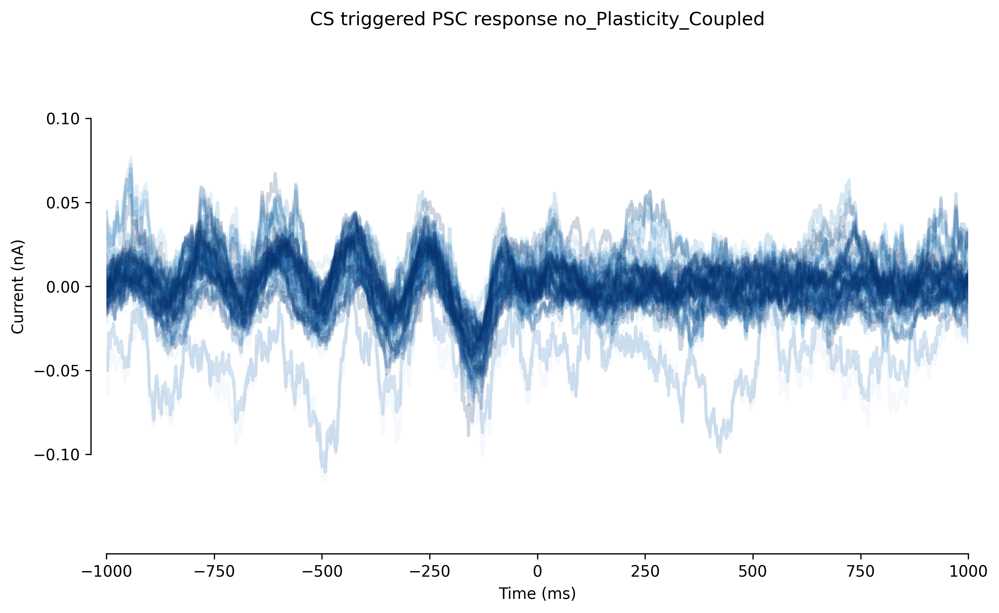

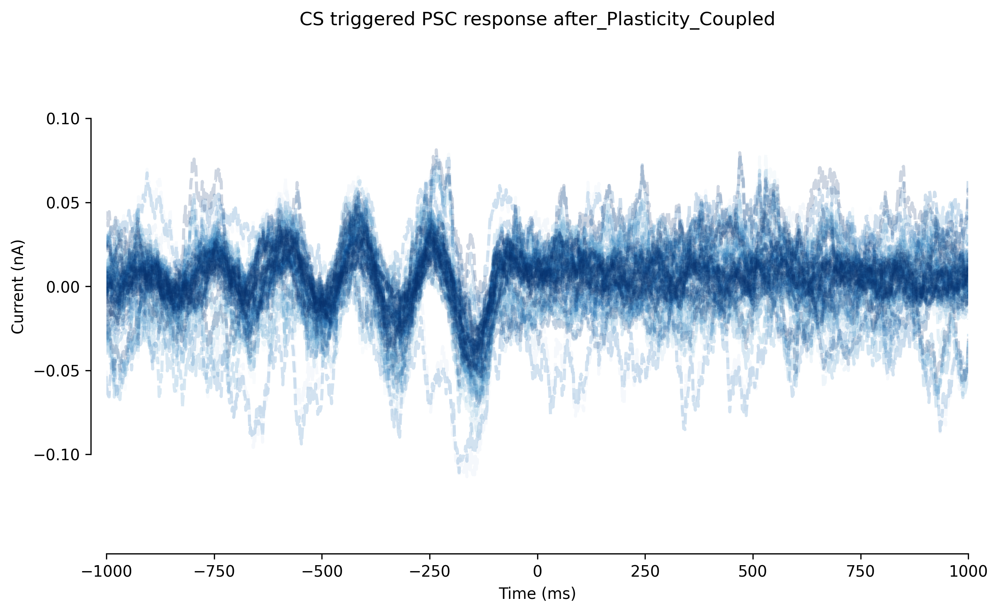

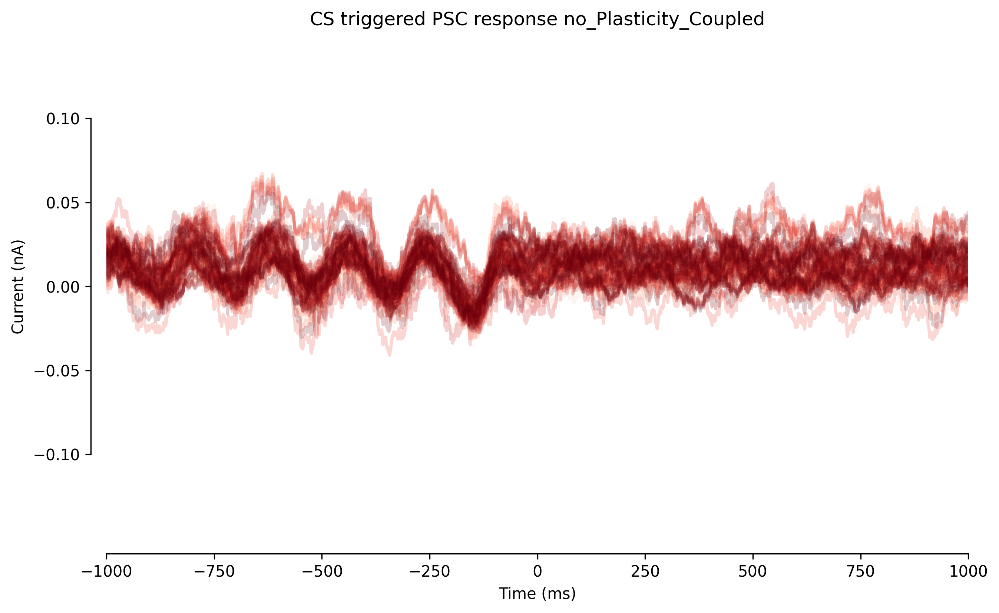

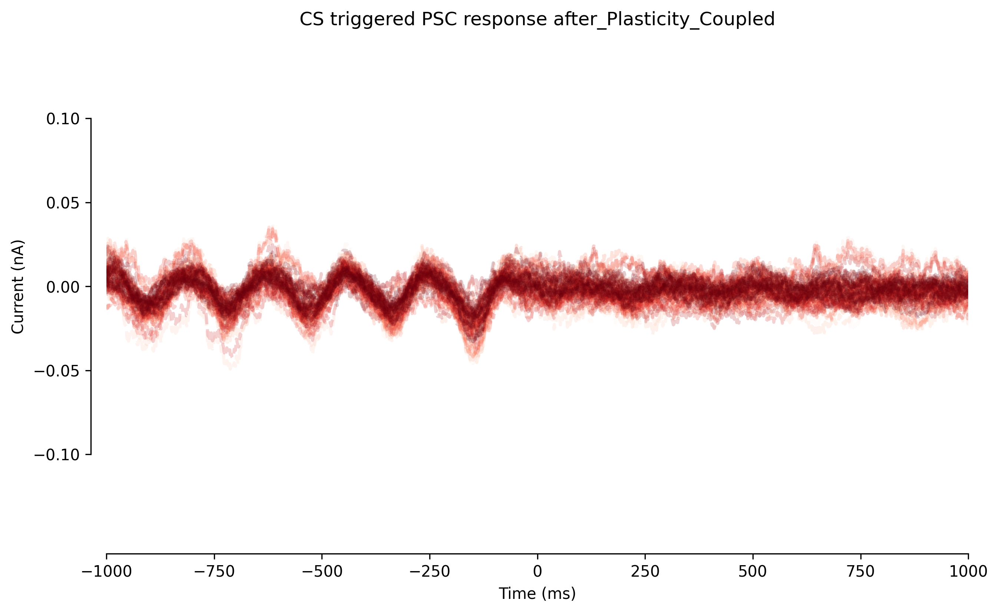

In [3]:
coupling = '_Coupled'
for zebrin in zebrin_range:
    if zebrin == 'positive':
        cmap = plt.get_cmap('Blues')
    elif zebrin == 'negative':
        cmap = plt.get_cmap('Reds')
    for plasticity in ['no_Plasticity','after_Plasticity']:
        figure(figsize=(10,6),dpi=300)
        title(f'CS triggered PSC response {plasticity}{coupling}')
        for pc_num in range(N_Cells_PC):
            PF_trig_avg = df_all_IO_trig_PF[(df_all_IO_trig_PF['cell']==pc_num)&(df_all_IO_trig_PF['zebrin']==zebrin)&(df_all_IO_trig_PF['plasticity']==plasticity)&(df_all_IO_trig_PF['f0']==f0)&(df_all_IO_trig_PF['coupling']==coupling)]
            if PF_trig_avg.empty:
                continue
            PF_trig_avg = PF_trig_avg.iloc[0]['PF_trig_avg']
            plot(linspace(-step*1000,step*1000,len(PF_trig_avg)),PF_trig_avg-PF_trig_avg[0], linestyle=linstyle[plasticity],lw=2,color=cmap(3*(2+pc_num)),alpha=0.2,label=plasticity)
        xlim(-1000,1000)
        ylim(-0.15,0.15)
        sns.despine(trim=True,offset=10)
        ylabel('Current (nA)')
        xlabel('Time (ms)')
        plt.savefig(f'CS_PSC_{zebrin}{plasticity}.svg')
        plt.show()

### IO Response

In [4]:
%%time
data=[]
step = 2.5

data=[]
for f0 in f0_range[0:1]:
    for zebrin in ['negative','positive']:
        for plasticity in ['no_Plasticity','after_Plasticity']:
            for coupling in ['_Coupled','']:
                IO_num_con = Synaps['Seed_'+str(seed_number)].IO_PC_Synapse_Sources
                PC_output = output_load_run('PC',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                IO_output = output_load_run('IO',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                IO_spikes = output_load_run('IO_Spikes',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                PC_trig_big = []
                IO_trig_big = []
                for pc_num in range(N_Cells_PC):
                    spike_times = IO_spikes[f'{IO_num_con[pc_num]}']
                    PC_trig = []
                    IO_trig = []
                    for spike_time in spike_times:
                        start = int(spike_time*second/dt_rec)-int(step*second/dt_rec)
                        end = int(spike_time*second/dt_rec)+int(step*second/dt_rec)
                        if spike_time < step: continue
                        if spike_time+step > exp_run/second: continue
                        PC_trig.append(PC_output['v'][pc_num][start:end]/mV)
                        IO_trig.append(IO_output['Vs'][IO_num_con[pc_num]][start:end]/mV)
                    if not PC_trig: continue
                    if not IO_trig: continue 
                    PC_trig_avg = mean(PC_trig,axis=0)
                    IO_trig_avg = mean(IO_trig,axis=0)
                    row=dict(cell=pc_num,f0=f0,zebrin=zebrin,plasticity=plasticity,coupling=coupling,PC_trig_avg=PC_trig_avg,IO_trig_avg=IO_trig_avg)
                    data.append(row)
df_all_IO_trig_PC = pd.DataFrame(data)    


CPU times: user 14.7 s, sys: 5.39 s, total: 20.1 s
Wall time: 2min 4s


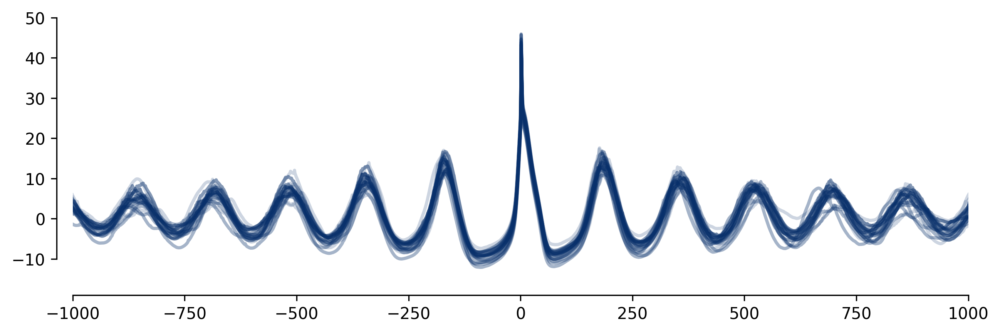

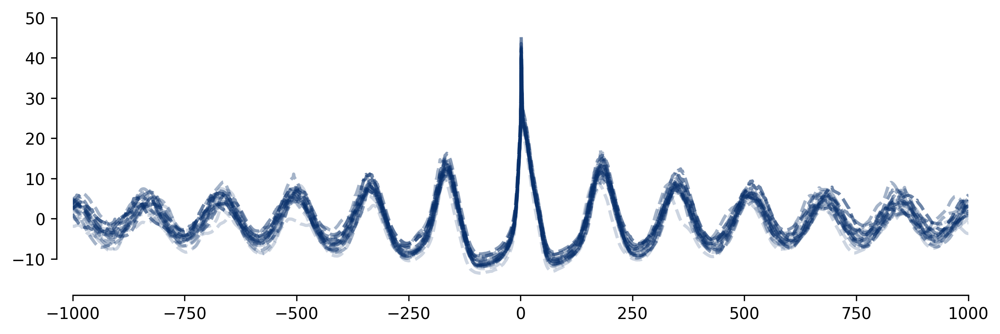

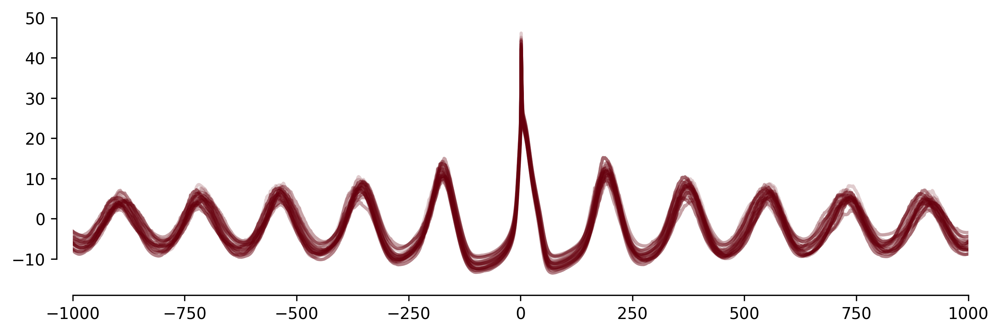

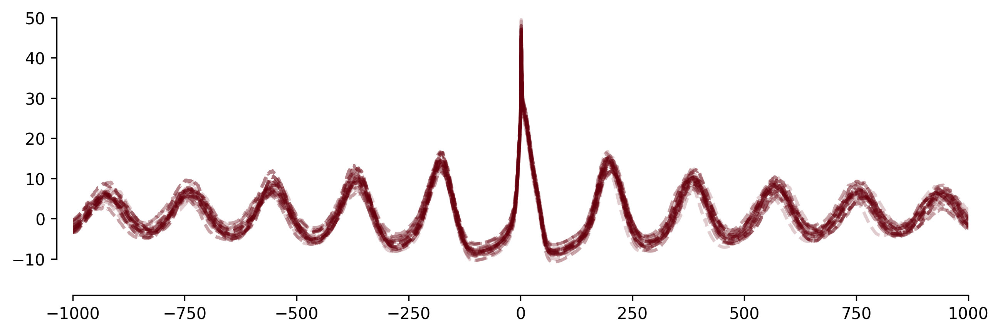

In [5]:
coupling = '_Coupled'
for zebrin in zebrin_range:
    if zebrin == 'positive':
        cmap = plt.get_cmap('Blues')
    elif zebrin == 'negative':
        cmap = plt.get_cmap('Reds')
    for plasticity in ['no_Plasticity','after_Plasticity']:
        figure(figsize=(10,3),dpi=300)
#         title(f'CS triggered IO response {plasticity}{coupling}')
        for dcn_num in range(N_Cells_IO):
            IO_trig_avg = df_all_IO_trig_PC[(df_all_IO_trig_PC['cell']==dcn_num)&(df_all_IO_trig_PC['zebrin']==zebrin)&(df_all_IO_trig_PC['plasticity']==plasticity)&(df_all_IO_trig_PC['f0']==f0)&(df_all_IO_trig_PC['coupling']==coupling)]
            if IO_trig_avg.empty:
                continue
            IO_trig_avg = IO_trig_avg.iloc[0]['IO_trig_avg']
            plot(linspace(-step*1000,step*1000,len(IO_trig_avg)),IO_trig_avg-IO_trig_avg[0], linestyle=linstyle[plasticity],lw=2,color=cmap(3*(2+10*dcn_num/3)),alpha=0.2,label=plasticity)
        xlim(-1000,1000)
        ylim(-15,50)
#         axis('off')
        sns.despine(trim=True,offset=10)
#         ylabel('Current (nA)')
#         xlabel('Time (ms)')
        plt.savefig(f'CS_IO_{zebrin}{plasticity}.svg')
        plt.show()

### CF Pause

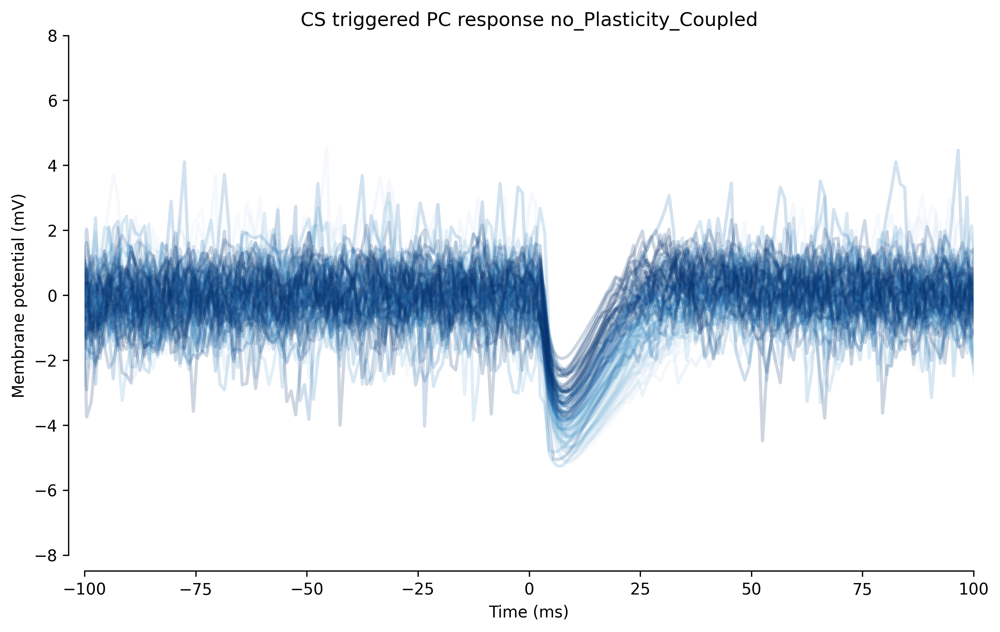

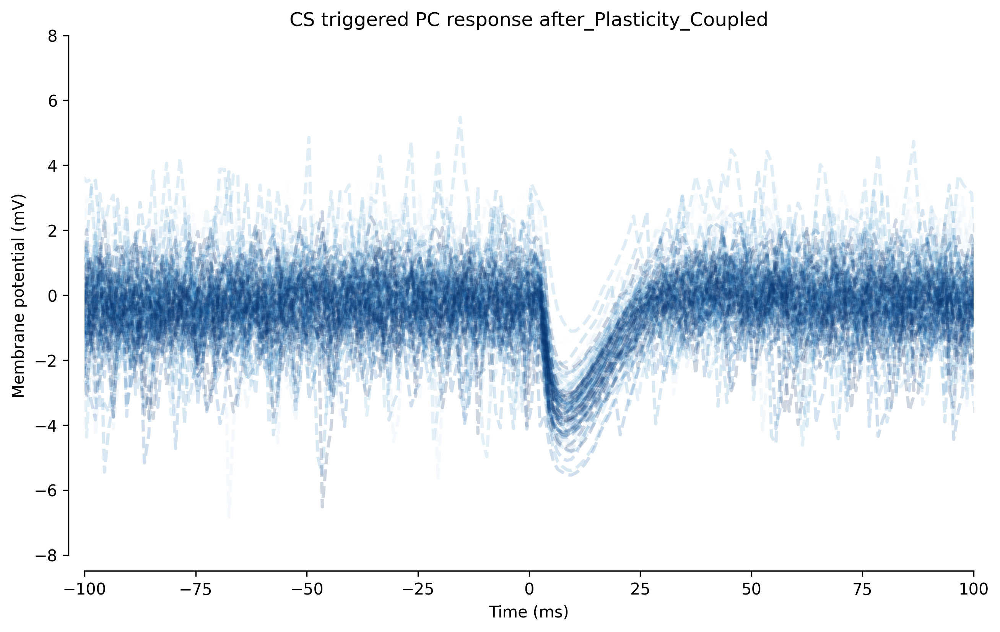

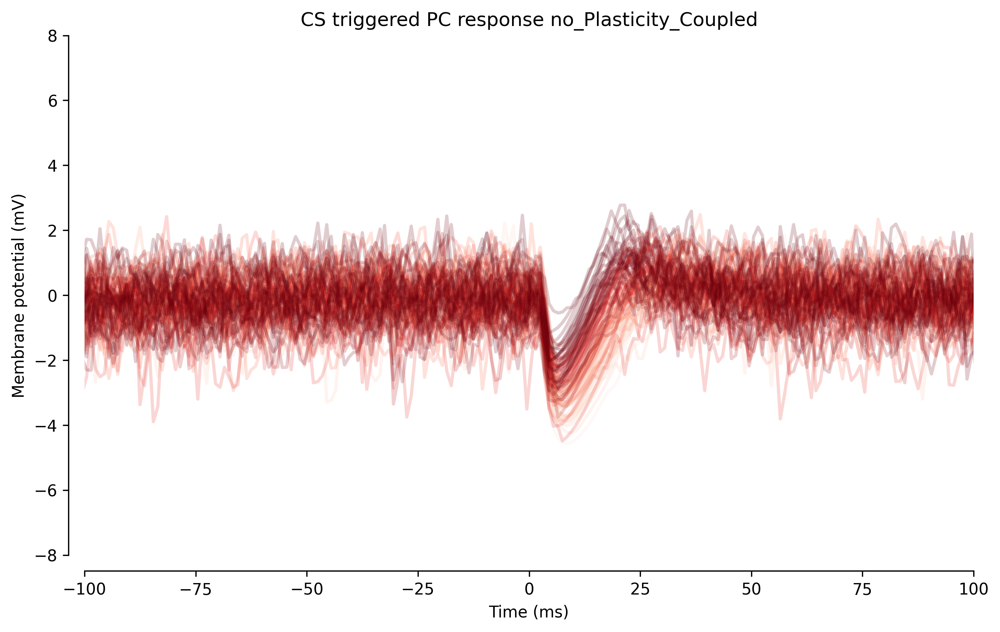

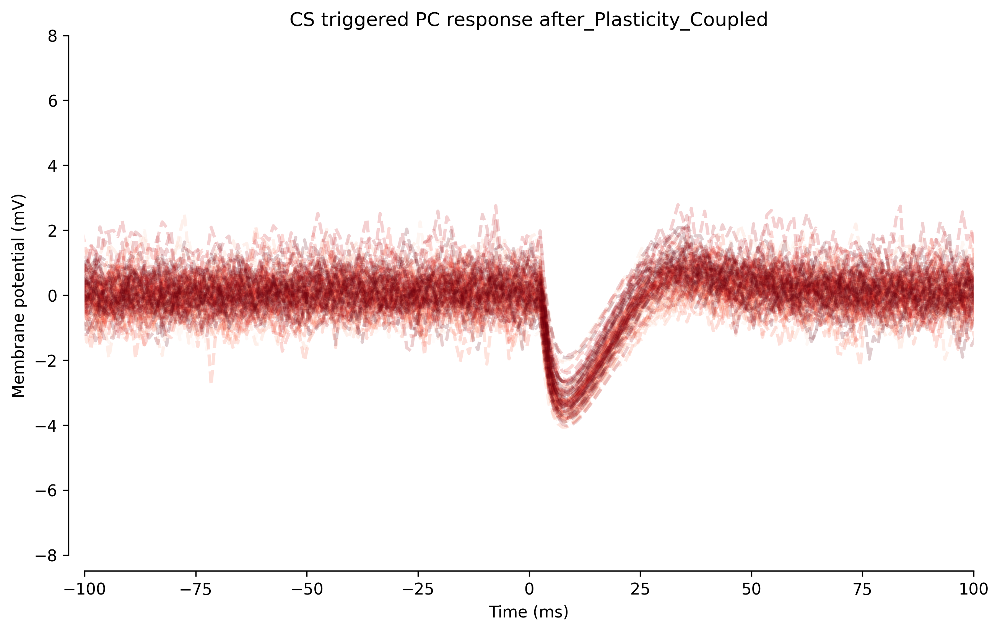

In [6]:
coupling = '_Coupled'
for zebrin in zebrin_range:
    if zebrin == 'positive':
        cmap = plt.get_cmap('Blues')
    elif zebrin == 'negative':
        cmap = plt.get_cmap('Reds')
    for plasticity in ['no_Plasticity','after_Plasticity']:
        figure(figsize=(10,6),dpi=300)
        title(f'CS triggered PC response {plasticity}{coupling}')
        for dcn_num in range(N_Cells_PC):
            PC_trig_avg = df_all_IO_trig_PC[(df_all_IO_trig_PC['cell']==dcn_num)&(df_all_IO_trig_PC['zebrin']==zebrin)&(df_all_IO_trig_PC['plasticity']==plasticity)&(df_all_IO_trig_PC['f0']==f0)&(df_all_IO_trig_PC['coupling']==coupling)].iloc[0]['PC_trig_avg']
            plot(linspace(-step*1000,step*1000,len(PC_trig_avg)),PC_trig_avg-PC_trig_avg[0], linestyle=linstyle[plasticity],lw=2,color=cmap(3*(2+dcn_num)),alpha=0.2,label=plasticity)
        xlim(-100,100)
        ylim(-8,8)
        ylabel('Membrane potential (mV)')
        xlabel('Time (ms)')
        sns.despine(trim=True,offset=10)
        plt.savefig(f'CS_SS_{zebrin}{plasticity}.svg')
        plt.show()

# Figure 4 - B

In [ ]:
%%time
step = 2.5
data=[]
for f0 in f0_range[0:1]:
    for zebrin in ['negative','positive']:
        for plasticity in ['no_Plasticity','after_Plasticity']:
            for coupling in ['_Coupled','']:
                IO_num_con = Synaps['Seed_'+str(seed_number)].DCN_IO_Synapse_Targets
                DCN_output = output_load_run('DCN',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                IO_output = output_load_run('IO',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                DCN_spikes = output_load_run('DCN_Spikes',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                DCN_trig_big = []
                IO_trig_big = []
                for DCN_num in range(N_Cells_DCN):
                    for idx,val in enumerate(Synaps['Seed_'+str(seed_number)].DCN_IO_Synapse_Targets):
                        if val == DCN_num:
                            spike_times = DCN_spikes[f'{DCN_num}']
                            DCN_trig = []
                            IO_trig = []
                            for spike_time in spike_times:
                                start = int(spike_time*second/dt_rec)-int(step*second/dt_rec)
                                end = int(spike_time*second/dt_rec)+int(step*second/dt_rec)
                                if spike_time < step: continue
                                if spike_time+step > exp_run/second: continue
                                DCN_trig.append(DCN_output['v'][DCN_num][start:end]/mV)
                                IO_trig.append(IO_output['Vs'][IO_num_con[idx]][start:end]/mV)
                        else: continue
                    if not DCN_trig: continue
                    if not IO_trig: continue 
                    DCN_trig_avg = mean(DCN_trig,axis=0)
                    IO_trig_avg = mean(IO_trig,axis=0)
                    row=dict(cell=DCN_num,f0=f0,zebrin=zebrin,plasticity=plasticity,coupling=coupling,DCN_trig_avg=DCN_trig_avg,IO_trig_avg=IO_trig_avg)
                    data.append(row)
df_all_DCN_trig_IO = pd.DataFrame(data)   

In [ ]:
coupling = '_Coupled'
for zebrin in zebrin_range:
    if zebrin == 'positive':
        cmap = plt.get_cmap('Blues')
    elif zebrin == 'negative':
        cmap = plt.get_cmap('Reds')
    for plasticity in ['no_Plasticity','after_Plasticity']:
        figure(figsize=(10,6),dpi=300)
        title(f'DCN triggered IO response {plasticity}{coupling}')
        for dcn_num in range(N_Cells_DCN):
            IO_trig_avg = df_all_DCN_trig_IO[(df_all_DCN_trig_IO['cell']==dcn_num)&(df_all_DCN_trig_IO['zebrin']==zebrin)&(df_all_DCN_trig_IO['plasticity']==plasticity)&(df_all_DCN_trig_IO['f0']==f0)&(df_all_DCN_trig_IO['coupling']==coupling)].iloc[0]['IO_trig_avg']
            plot(linspace(-step*1000,step*1000,len(IO_trig_avg)),IO_trig_avg-IO_trig_avg[0], linestyle=linstyle[plasticity],lw=2,color=cmap((2+10*dcn_num)),alpha=0.7,label=plasticity)
        xlim(-1000,1000)
        ylabel('Membrane potential (mV)')
        xlabel('Time (ms)')
        ylim(-2.0,2.5)
        # plt.legend()
#         axis('off')
        sns.despine(trim=True,offset=10)
        plt.savefig(f'CN_IO_{zebrin}{plasticity}.svg')
        plt.show()
        
        io_heatmap = []
        for dcn_num in range(N_Cells_DCN):
            response = df_all_DCN_trig_IO[(df_all_DCN_trig_IO['cell']==dcn_num)&(df_all_DCN_trig_IO['zebrin']==zebrin)&(df_all_DCN_trig_IO['plasticity']==plasticity)&(df_all_DCN_trig_IO['f0']==f0)&(df_all_DCN_trig_IO['coupling']==coupling)].iloc[0]['IO_trig_avg']
            io_heatmap.append(response)

        cbar_kws = { 'ticks' : [-62,-60,-58] }
        fig=figure(figsize=(12,2),dpi=300)
        title(f'DCN triggered IO response Zebrin {zebrin} {plasticity}{coupling}')
        sns.heatmap(io_heatmap,vmin=np.min(io_heatmap),vmax=np.max(io_heatmap),cmap = plt.get_cmap('coolwarm_r'),cbar_kws = cbar_kws)
#         axvline(len(response)/2,color='k')
#         xticks(linspace(-step*1000,step*1000,len(IO_trig_avg)))
        axis('off')
        sns.despine(trim=True,offset=10)
        plt.savefig(f'CN_IO_heatmap_{zebrin}{plasticity}.svg')
        plt.show()

In [ ]:
%%time
data=[]
for f0 in f0_range[0:1]:
    for zebrin in ['negative','positive']:
        for plasticity in ['no_Plasticity','after_Plasticity']:
            for coupling in ['_Coupled','']:
                DCN_conn = Synaps['Seed_'+str(seed_number)].PC_DCN_Synapse_Targets
                PC_output = output_load_run('PC',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                DCN_output = output_load_run('DCN',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                PC_spikes = output_load_run('PC_Spikes',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                PC_trig_big = []
                DCN_trig_big = []
                for pc_num in range(0,N_Cells_PC,30):
                    spike_times = PC_spikes[f'{pc_num}']
                    PC_trig = []
                    DCN_trig = []
                    for idx,val in enumerate(Synaps['Seed_'+str(seed_number)].PC_DCN_Synapse_Sources):
                        if val == pc_num:
                            dcn_num = DCN_conn[idx]
                            for spike_time in spike_times:
                                start = int(spike_time*second/dt_rec)-int(step*second/dt_rec)
                                end = int(spike_time*second/dt_rec)+int(step*second/dt_rec)
                                if spike_time < step: continue
                                if spike_time+step > exp_run/second: continue
                                PC_trig.append(PC_output['v'][pc_num][start:end]/mV)
                                DCN_trig.append(DCN_output['v'][dcn_num][start:end]/mV)
                        else:
                            continue
                    if not PC_trig: continue
                    if not DCN_trig: continue 
                    PC_trig_avg = mean(PC_trig,axis=0)
                    DCN_trig_avg = mean(DCN_trig,axis=0)
                    row=dict(cell=pc_num,f0=f0,zebrin=zebrin,plasticity=plasticity,coupling=coupling,PC_trig_avg=PC_trig_avg,DCN_trig_avg=DCN_trig_avg)
                    data.append(row)
df_all_PC_trig_DCN = pd.DataFrame(data)    

# Figure 4 - C,D,E

In [2]:
%%time
t_start = 1 * second
t_stop = 59 * second
bin_size = 1 * second
coupling = '_Coupled'

cell_pop_sizes = dict(PC=N_Cells_PC,IO=N_Cells_IO,DCN=N_Cells_DCN)
colors = dict(positive='#1c4981',negative='#8a1218')
names = {}
for plasticity in plasticity_range:
    if plasticity == 'no_Plasticity': names[f'{plasticity}'] = 'NP'
    elif plasticity == 'Plasticity': names[f'{plasticity}'] = 'P1'
    elif plasticity == 'Plasticity2': names[f'{plasticity}'] = 'P2'
    elif plasticity == 'Plasticity3': names[f'{plasticity}'] = 'P3'
    elif plasticity == 'Plasticity4': names[f'{plasticity}'] = 'P4'
    elif plasticity == 'after_Plasticity': names[f'{plasticity}'] = 'AP1'
    elif plasticity == 'after_Plasticity2': names[f'{plasticity}'] = 'AP2'
    elif plasticity == 'after_Plasticity3': names[f'{plasticity}'] = 'AP3'
    elif plasticity == 'after_Plasticity4': names[f'{plasticity}'] = 'AP4'
        

data = []
for coupling in (['', '_Coupled']):
    for cell_name in ['PC','DCN','IO']:
        for zebrin in zebrin_range:
            for order,plasticity in enumerate(['after_Plasticity','no_Plasticity']):
                spikes_output = output_load_run(f'{cell_name}_Spikes',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
                for cell_num in range(cell_pop_sizes[cell_name]):
                    spikes = spikes_output[f'{cell_num}']
                    bin_edges = np.arange(t_start, t_stop+bin_size, bin_size)
                    spike_counts, _ = np.histogram(spikes, bins=bin_edges)
                    mean_count = spike_counts / bin_size
                    row = dict(frequency = mean(mean_count/Hz))
                    row['cell'] = cell_name
                    row['plasticity'] = names[f'{plasticity}']
                    row['zebrin'] = zebrin
                    row['coupling'] = coupling
                    row['order'] = f'{order}'+names[f'{plasticity}']
                    data.append(row)
df_ff = pd.DataFrame(data)


CPU times: user 201 ms, sys: 51.6 ms, total: 253 ms
Wall time: 835 ms


Mann-Whitney u test
  Zebrin negative after_Plasticity
 U = 8867.0, p = 0.0
Degree of freedom 1: 99
Degree of freedom 2: 99
F-statistic: 36.00431677349011
p-value: 0.9999999999999999


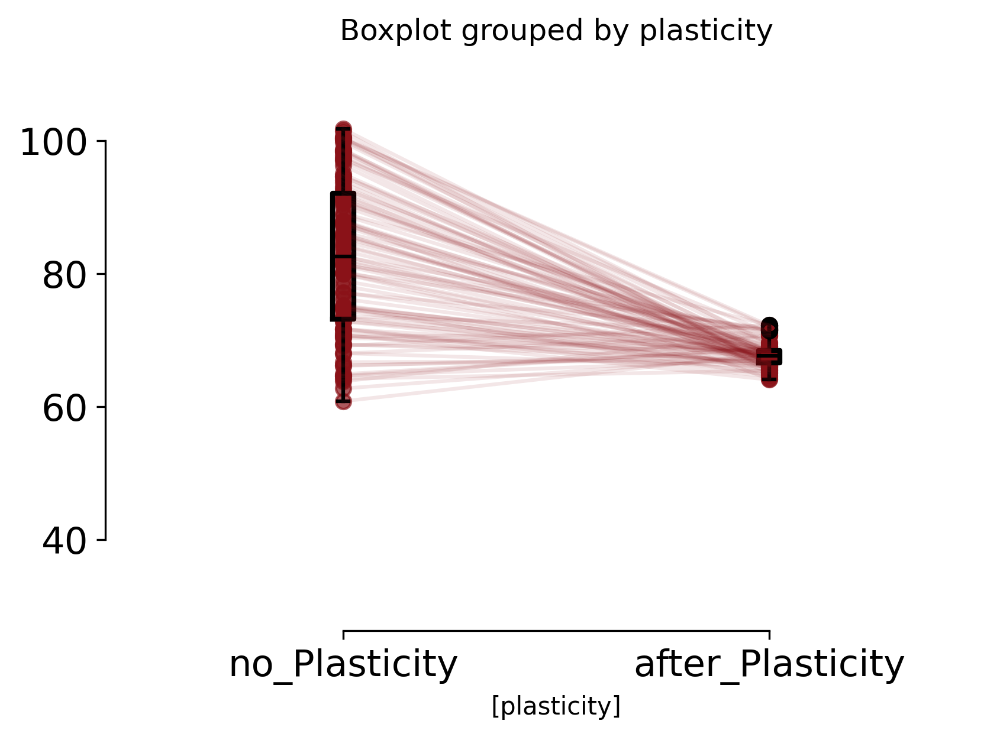

Mann-Whitney u test
  Zebrin positive after_Plasticity
 U = 2677.5, p = 0.0
Degree of freedom 1: 99
Degree of freedom 2: 99
F-statistic: 59.878653588789646
p-value: 0.9999999999999999


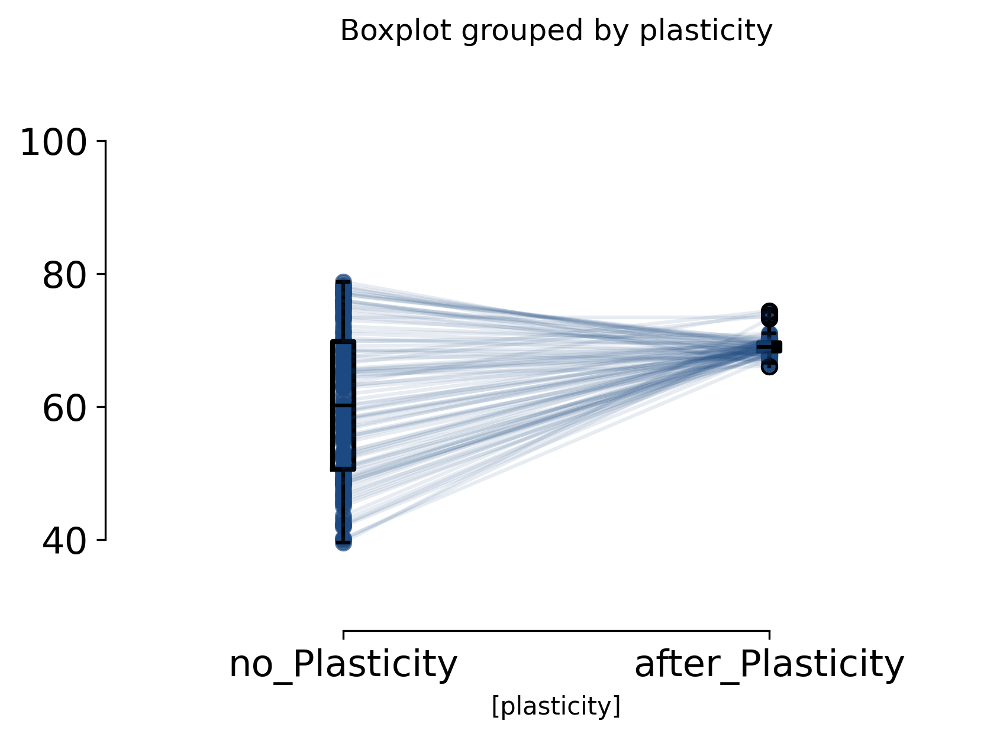

Mann-Whitney u test
  Zebrin negative after_Plasticity
 U = 533.5, p = 0.01
Degree of freedom 1: 39
Degree of freedom 2: 39
F-statistic: 0.735942263399945
p-value: 0.17120565611344057


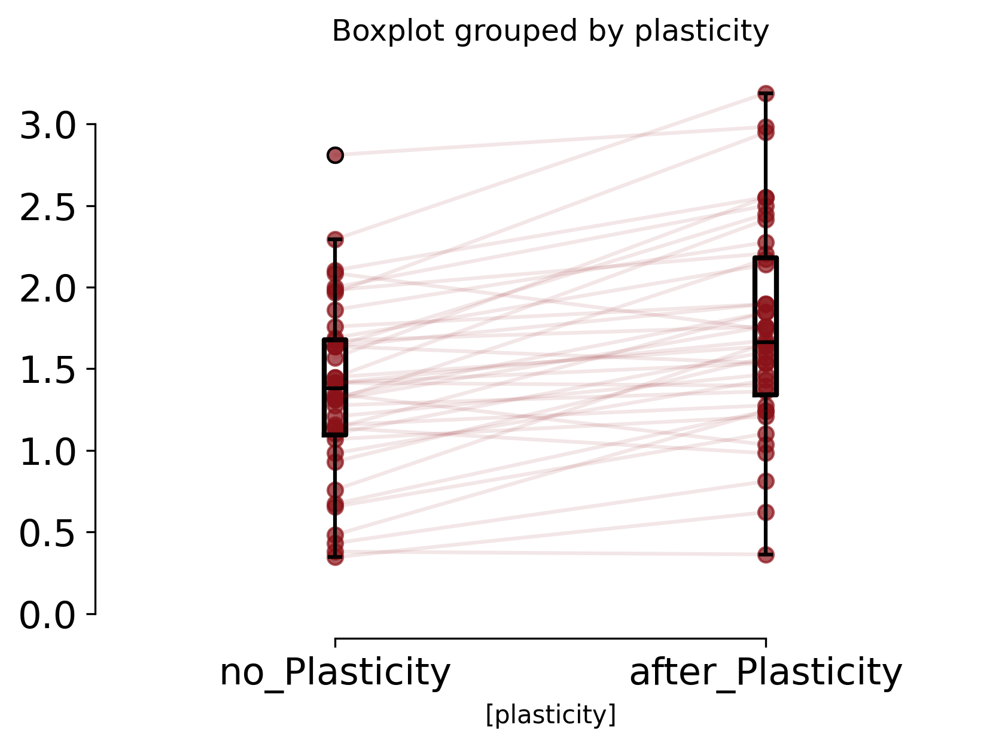

Mann-Whitney u test
  Zebrin positive after_Plasticity
 U = 1106.0, p = 0.003
Degree of freedom 1: 39
Degree of freedom 2: 39
F-statistic: 1.5123039717109585
p-value: 0.8995196532874197


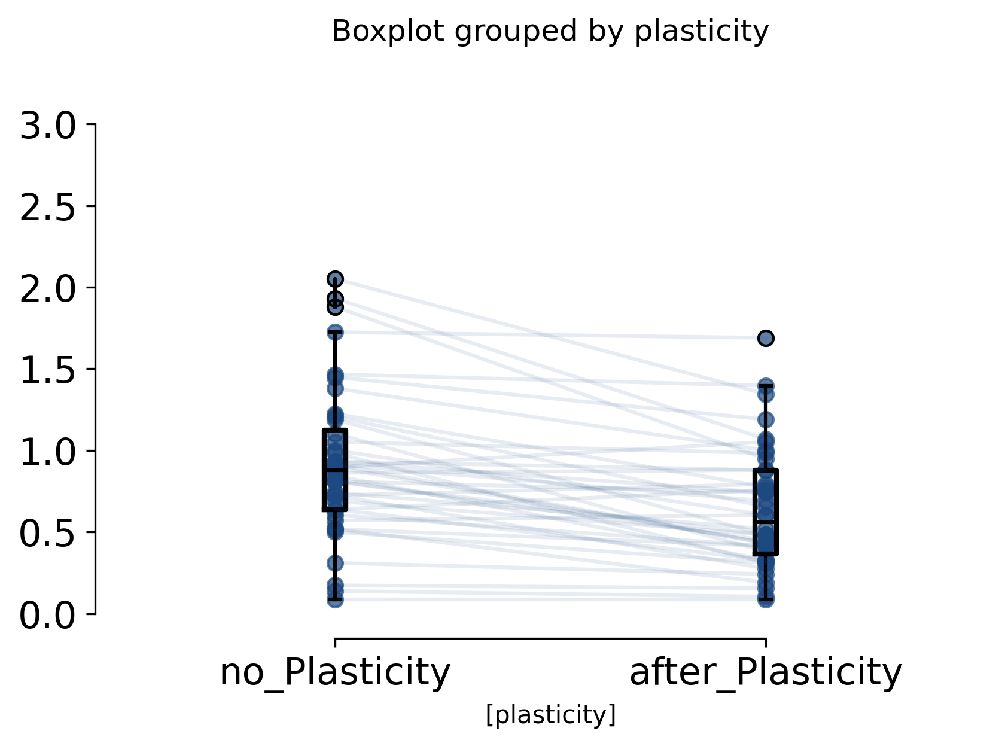

Mann-Whitney u test
  Zebrin negative after_Plasticity
 U = 176.5, p = 0.0
Degree of freedom 1: 39
Degree of freedom 2: 39
F-statistic: 1.6943178906118264
p-value: 0.9480935518760079


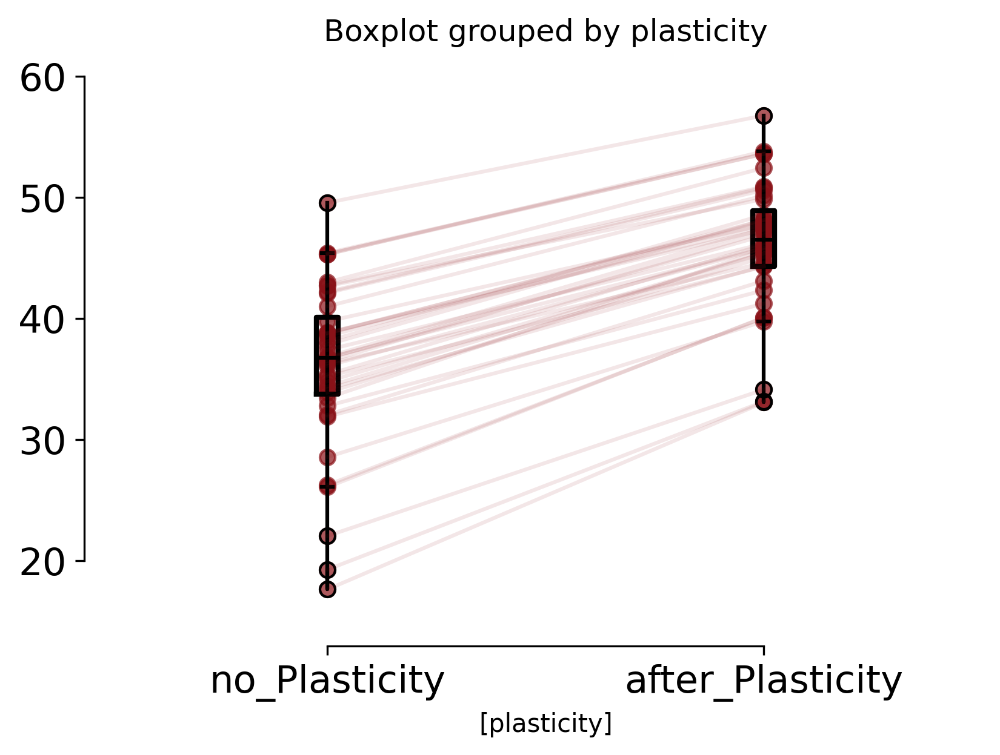

Mann-Whitney u test
  Zebrin positive after_Plasticity
 U = 1276.0, p = 0.0
Degree of freedom 1: 39
Degree of freedom 2: 39
F-statistic: 0.7678930752156494
p-value: 0.2066158733537831


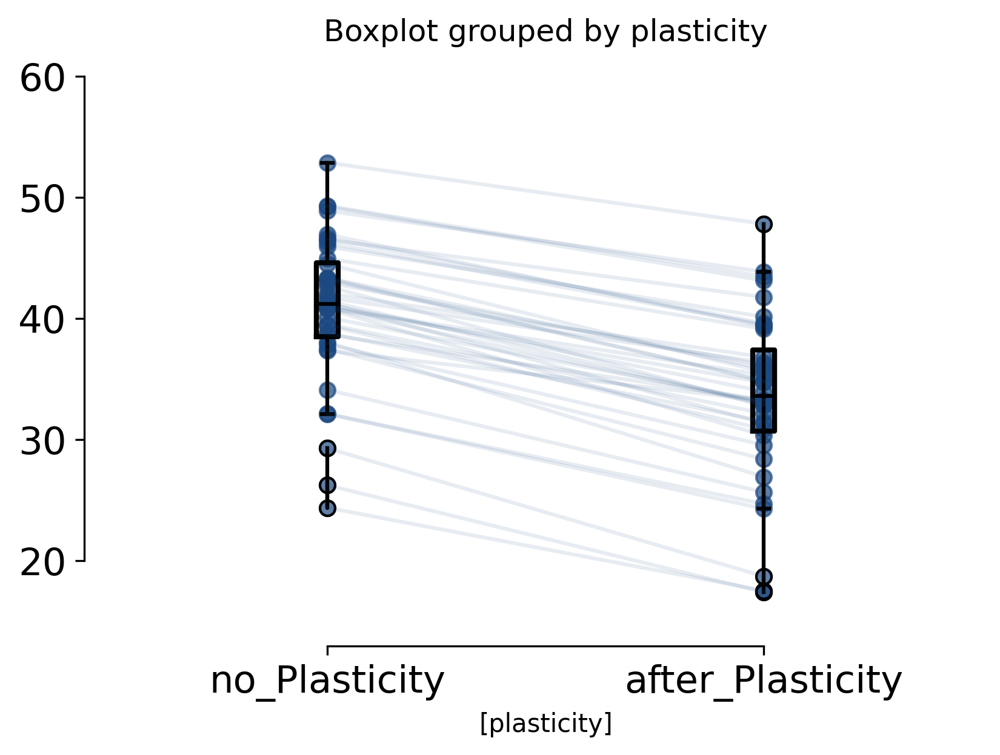

In [3]:
var = 'frequency'
for cell_name in ['PC','IO','DCN']:
    for zebrin in ['negative','positive']:
        df_data = df_ff[(df_ff["coupling"]==coupling) & (df_ff["cell"]==cell_name) & (df_ff["zebrin"]==zebrin)]
        Q1, Q3 = percentile(df_data[var],[5,95])
        IQR = Q3 - Q1    #IQR is interquartile range. 
        lower_boundary = Q1 - 1.5 * IQR
        upper_boundary = Q3 + 1.5 * IQR
        df_data2 = df_data[(df_data[var] < upper_boundary) & (df_data[var] > lower_boundary)]
        fig = plt.figure(dpi=300)
        flierproperties = dict(markerfacecolor = 'white', markeredgecolor = 'white')
        bp = df_data2.boxplot(column=var, by=['plasticity'], grid=False, figsize=(4,3), widths=0.05, fontsize=15,
                             color=dict(boxes='k', whiskers='k', medians='k', caps='k'),
                             boxprops=dict(linestyle='-', linewidth=2),
                             flierprops=dict(linestyle='-', linewidth=1.5),
                             medianprops=dict(linestyle='-', linewidth=1.5, color = 'k'),
                             whiskerprops=dict(linestyle='-', linewidth=1.5),
                             capprops=dict(linestyle='-', linewidth=1.5),
                         positions=[2,1],ax = plt.gca())      
        title(f'')#title(f'CF Pauses {plasticity}{coupling}')
#         colors = dict(positive='b',negative='r')
        x = {}
        y = {}
        for i,plasticity in enumerate(['no_Plasticity','after_Plasticity']):
            y[f'{i}'] = df_data2.frequency[(df_data2.zebrin==zebrin) & (df_data2.plasticity==names[f'{plasticity}'])].dropna()
            x[f'{i}'] = [1+i]*len(y[f'{i}'])#np.random.normal(1+j+(len(plasticity_range[0:1]))*i, 0.12, size=len(y))    # Add some random "jitter" to the x-axis
            scatter(x[f'{i}'], y[f'{i}'],color=f'{colors[zebrin]}', alpha=0.7)
        from scipy.stats import mannwhitneyu
        U1, p = mannwhitneyu(y['0'], y['1'], method="exact")
        print(f'Mann-Whitney u test\n  Zebrin {zebrin} {plasticity}\n U = {U1}, p = {round(p,3)}')
        import scipy.stats as stats
        variance1 = np.var(y['0'], ddof=1)
        variance2 = np.var(y['1'], ddof=1)
        f_value = variance1 / variance2
        df1 = len(y['0']) - 1
        df2 = len(y['1']) - 1
        p_value = stats.f.cdf(f_value, df1, df2)
        print('Degree of freedom 1:',df1)
        print('Degree of freedom 2:',df2)
        print("F-statistic:", f_value)
        print("p-value:", p_value)
        toPlot = zip(x['0'], y['0'], x['1'], y['1'])
        for tuple in toPlot:
            plot([tuple[0], tuple[2]], [tuple[1], tuple[3]], color=f'{colors[zebrin]}',alpha=0.1)
        xticks([1,2],['no_Plasticity','after_Plasticity'])
        if cell_name == 'PC':
            ylim([30,110])
        elif cell_name == 'IO':
            ylim([0,3.3])
        elif cell_name == 'DCN':
            ylim([15,60])
        plt.savefig(f'{cell_name}_{var}_boxplot_{zebrin}.svg')
        sns.despine(trim=True,offset = 10)
        plt.show()

# Figure 4 - F

In [4]:
%%time 

skip = 5*ms/second # seconds
transient_time = 10000
data = []
# 
for zebrin in zebrin_range:
    zeb_name = 'Z+'
    if zebrin == 'negative': zeb_name = 'Z-'
    for coupling in coupling_range:
        coup_name = 'Coup'
        if coupling == '': coup_name = 'Uncoup'
        for plasticity in ['no_Plasticity','after_Plasticity']:
            plas_name = 'NP'
            if plasticity == 'Plasticity': plas_name = 'P'
            elif plasticity == 'after_Plasticity': plas_name = 'AP'
            IO_num_con = Synaps['Seed_'+str(seed_number)].IO_PC_Synapse_Sources
            IO_Spikes = output_load_run('IO_Spikes',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
            PC_Spikes = output_load_run('PC_Spikes',coupling,seed_number,plasticity,zebrin,noise_gain,exp_run,net_name,path_data,parameters_value,f0)
            for pc_cell_id in range(N_Cells_PC):
                pauses = []
                io_cell_id = IO_num_con[pc_cell_id]
                row = dict(PC=pc_cell_id)
                row['IO'] = io_cell_id
                for io_spike in IO_Spikes[f'{io_cell_id}']:
                    if io_spike < transient_time*ms/second: continue
                    hit = None
                    for pc_spike in PC_Spikes[f'{pc_cell_id}']:
                        if pc_spike <= io_spike+skip:
                            continue
                        hit = pc_spike
                        break
                    if hit is not None:
                        pauses.append((hit - io_spike))
                pauses = np.array(pauses)*1e3
                row['average_pause'] = mean(pauses)
                row['zebrin'] = zebrin
                row['plasticity'] = plasticity
                row['coupling'] = coupling
                data.append(row)
                
df_pauses = pd.DataFrame(data).dropna()
colors = dict(positive='#1c4981',negative='#8a1218')

CPU times: user 1min 8s, sys: 20.9 ms, total: 1min 8s
Wall time: 1min 9s


Mann-Whitney u test
  Zebrin negative after_Plasticity
 U = 1186.0, p = 0.0
Degree of freedom 1: 99
Degree of freedom 2: 99
F-statistic: 9.341745634731915
p-value: 0.9999999999999999


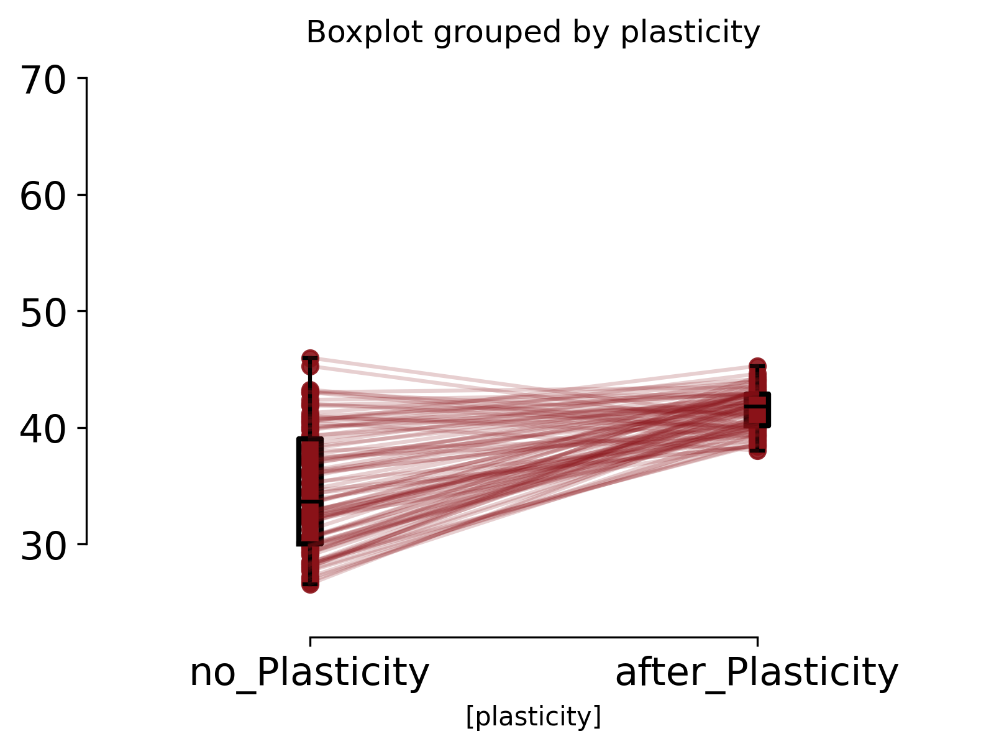

Mann-Whitney u test
  Zebrin positive after_Plasticity
 U = 6737.0, p = 0.0
Degree of freedom 1: 99
Degree of freedom 2: 99
F-statistic: 20.764961980844042
p-value: 0.9999999999999999


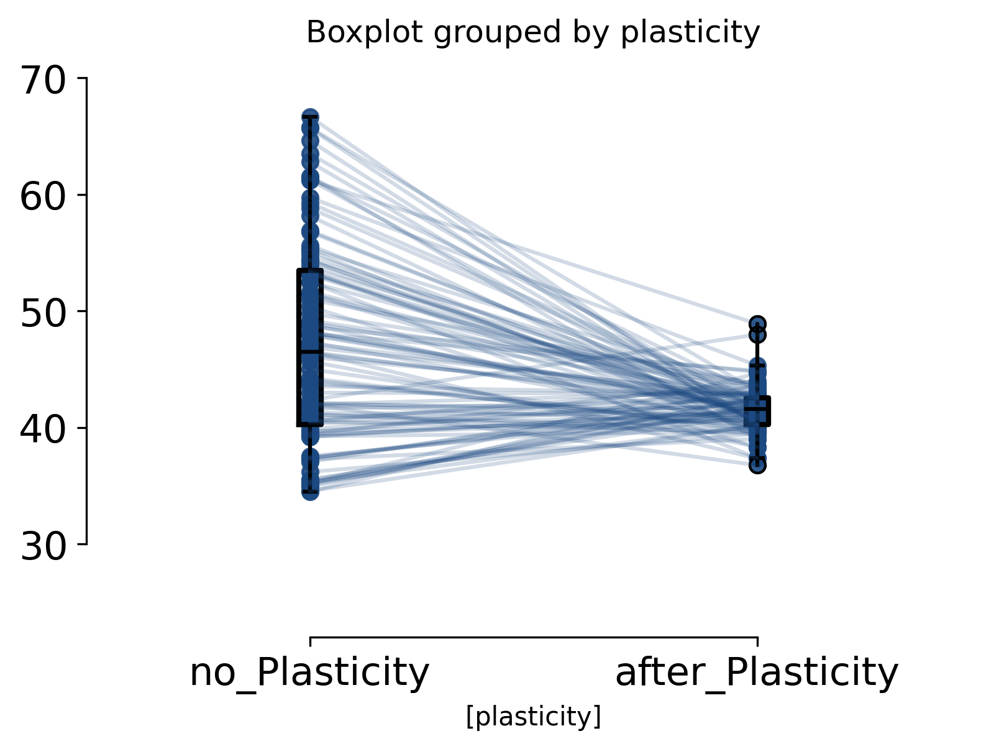

In [5]:
var = 'average_pause'
for zebrin in ['negative','positive']:
    df_data = df_pauses[(df_pauses["coupling"]==coupling)&(df_pauses["zebrin"]==zebrin)]
    Q1, Q3 = percentile(df_data[var],[5,95])
    IQR = Q3 - Q1    #IQR is interquartile range. 
    lower_boundary = Q1 - 1.5 * IQR
    upper_boundary = Q3 + 1.5 * IQR
    df_data2 = df_data[(df_data[var] < upper_boundary) & (df_data[var] > lower_boundary)]
    fig = plt.figure(dpi=300)
    flierproperties = dict(markerfacecolor = 'white', markeredgecolor = 'white')
    bp = df_data2.boxplot(column=var, by=['plasticity'], grid=False, figsize=(4,3), widths=0.05, fontsize=15,
                         color=dict(boxes='k', whiskers='k', medians='k', caps='k'),
                         boxprops=dict(linestyle='-', linewidth=2),
                         flierprops=dict(linestyle='-', linewidth=1.5),
                         medianprops=dict(linestyle='-', linewidth=1.5, color = 'k'),
                         whiskerprops=dict(linestyle='-', linewidth=1.5),
                         capprops=dict(linestyle='-', linewidth=1.5),
                         positions=[2,1],ax = plt.gca()) 
    title(f'')#title(f'CF Pauses {plasticity}{coupling}')
    colors = dict(positive='#1c4981',negative='#8a1218')
    y = {}
    x = {}
    for i,plasticity in enumerate(['no_Plasticity','after_Plasticity']):
        y[f'{i}'] = df_data2.average_pause[(df_data2.plasticity==plasticity)].dropna()
        x[f'{i}'] = [1+i]*len(y[f'{i}'])#np.random.normal(1+j+(len(plasticity_range[0:1]))*i, 0.12, size=len(y))    # Add some random "jitter" to the x-axis
        scatter(x[f'{i}'], y[f'{i}'],color=f'{colors[zebrin]}', alpha=0.9)
    from scipy.stats import mannwhitneyu
    U1, p = mannwhitneyu(y['0'], y['1'], method="exact")
    print(f'Mann-Whitney u test\n  Zebrin {zebrin} {plasticity}\n U = {U1}, p = {round(p,3)}')
    import scipy.stats as stats
    variance1 = np.var(y['0'], ddof=1)
    variance2 = np.var(y['1'], ddof=1)
    f_value = variance1 / variance2
    df1 = len(y['0']) - 1
    df2 = len(y['1']) - 1
    p_value = stats.f.cdf(f_value, df1, df2)
    print('Degree of freedom 1:',df1)
    print('Degree of freedom 2:',df2)
    print("F-statistic:", f_value)
    print("p-value:", p_value)
    toPlot = zip(x['0'], y['0'], x['1'], y['1'])
    for tuple in toPlot:
        plot([tuple[0], tuple[2]], [tuple[1], tuple[3]], color=f'{colors[zebrin]}',alpha=0.2)
    xticks([1,2],['no_Plasticity','after_Plasticity'])
    ylim([22,70])
    sns.despine(trim=True)
    plt.savefig(f'CF_{var}_boxplot_{zebrin}.svg')
    plt.show()